In [ ]:
import pandas as pd
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import torchvision.utils as vutils




In [ ]:
# Hyperparameters

batch_size = 64 # Batch size during training
image_size = 128  # Images are 128x128(resized)
image_channels = 3  # RGB images
ngpu=1 #number of GPUs to use
z_dim = 100  # Size/dimension of the latent vector (input noise)
gen_features = 64  # Feature map size of Generator
dis_features = 64  # Feature map size Discriminator
epochs = 100  # Number of epochs during train
lr = 0.0002  # Learning rate
beta1 = 0.5  # Beta1-A hyperparameter in Adam optimizer
beta2= 0.999 # Beta2-A hyperparameter in for Adam optimizer


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

Question 1:

Train a DC GAN (with an architecture of your choice) on the given data
with the usual GAN loss. Plot the loss curves for the Generator and
Discriminator losses

Generator for DCGAN

In [ ]:
'''
   Takes input as latent vector(sampled from normal distribution)
   this input passed through series of transpose conv,batch norm and activation function
   layers for upsampling.
   Gives a newly generated images as output
'''

class dcgan_Generator(nn.Module):
    def __init__(self, z_dim, image_channels,gen_features):
        super(dcgan_Generator, self).__init__()
        self.generator_layers=nn.Sequential(
            nn.ConvTranspose2d(in_channels=z_dim,out_channels=gen_features*16,kernel_size=4,stride=1,padding=0,bias=False),
            nn.BatchNorm2d(gen_features*16),
            nn.ReLU(True),

            nn.ConvTranspose2d(in_channels=gen_features*16,out_channels=gen_features*8,kernel_size=4,stride=2,padding=1,bias=False),
            nn.BatchNorm2d(gen_features*8),
            nn.ReLU(True),

            nn.ConvTranspose2d(in_channels=gen_features*8,out_channels=gen_features*4,kernel_size=4,stride=2,padding=1,bias=False),
            nn.BatchNorm2d(gen_features*4),
            nn.ReLU(True),

            nn.ConvTranspose2d(in_channels=gen_features*4,out_channels=gen_features*2,kernel_size=4,stride=2,padding=1,bias=False),
            nn.BatchNorm2d(gen_features*2),
            nn.ReLU(True),

            nn.ConvTranspose2d(in_channels=gen_features*2,out_channels=gen_features,kernel_size=4,stride=2,padding=1,bias=False),
            nn.BatchNorm2d(gen_features),
            nn.ReLU(True),

            nn.ConvTranspose2d(in_channels=gen_features,out_channels=image_channels,kernel_size=4,stride=2,padding=1,bias=False),
            nn.Tanh() #scales pixel values(-1 to 1)

        )


    def forward(self,x):
        return self.generator_layers(x)


Discriminator for DCGAN

In [ ]:
''' Takes an image as input,it would be real or fake(generated).
    this input passed through series of conv,batch norm and activation function
    layers for downsampling
    gives ouput as whether it is real or fake(0 or 1)
'''


class dcgan_Discriminator(nn.Module):
    def __init__(self, image_channels,dis_features):
        super(dcgan_Discriminator, self).__init__()
        self.discriminator_layers = nn.Sequential(
            nn.Conv2d(in_channels= image_channels,out_channels=dis_features,kernel_size=4,stride=2,padding=1,bias=False),
            nn.LeakyReLU(0.2,inplace=True),

            nn.Conv2d(in_channels=dis_features,out_channels=dis_features*2,kernel_size=4,stride=2,padding=1,bias=False),
            nn.BatchNorm2d(dis_features*2),
            nn.LeakyReLU(0.2,inplace=True),

            nn.Conv2d(in_channels=dis_features*2,out_channels=dis_features*4,kernel_size=4,stride=2,padding=1,bias=False),
            nn.BatchNorm2d(dis_features*4),
            nn.LeakyReLU(0.2,inplace=True),

            nn.Conv2d(in_channels=dis_features*4,out_channels=dis_features*8,kernel_size=4,stride=2,padding=1,bias=False),
            nn.BatchNorm2d(dis_features*8),
            nn.LeakyReLU(0.2,inplace=True),

            nn.Conv2d(in_channels=dis_features*8,out_channels=1,kernel_size=4,stride=1,padding=0,bias=False),
            nn.Sigmoid()#gives 0 or 1
        )

    def forward(self,x):
        return self.discriminator_layers(x)


In [ ]:
#Weights initialization
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
#testing the models(Generator and Discriminator)
def test_models():
    z_dim,k,in_channels,H,W =100,10,3,128,128 #k-examples,we are taking(10)
    x=torch.randn(k,in_channels,H,W)
    discriminator= dcgan_Discriminator(in_channels,64)
    weights_init(discriminator_layers)
    assert discriminator_layers(x).shape==(k,1,1,1)
    generator=dcgan_Generator(z_dim,in_channels,k)
    z=torch.randn((k,z_dim,1,1))
    weights_init(generator)
    assert generator(z).shape==(k,in_channels,H,W)
    print("model working..")

if __name__ == "__main__":
    test_models()

In [ ]:
Gen = dcgan_Generator(z_dim, image_channels, gen_features).to(device)
Gen.apply(weights_init)

Disc = dcgan_Discriminator(image_channels, dis_features).to(device)
Disc.apply(weights_init)

In [ ]:
criterion = nn.BCELoss()

In [ ]:
Disc_optimizer = optim.Adam(Disc.parameters(), lr=lr, betas=(0.5, 0.999))
Gen_optimizer = optim.Adam(Gen.parameters(), lr=lr, betas=(0.5, 0.999))

In [ ]:

Animal_transforms = transforms.Compose(
    [
        transforms.Resize((128, 128)),
        # transforms.RandomHorizontalFlip(),  # Randomly flip images horizontally
        # transforms.RandomVerticalFlip(p=0.5),  # Randomly flip images Vertically
        # transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),  # Translation augmentation
        # transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5),  # Brightness, contrast and saturation
        transforms.ToTensor(),
        transforms.Normalize([0.5] * 3, [0.5] * 3),
    ]
)

Animal_dataset= datasets.ImageFolder(root='/content/drive/MyDrive/chaitanya/animals_resized/animals_resized',transform= Animal_transforms)
dataloader= DataLoader(Animal_dataset,batch_size,shuffle=True)


In [ ]:
# print(f"No.of classes: {len(Animal_dataset.classes)}")
# print(f"No.of images: {len(Animal_dataset)}")
# print("Total Classes:", Animal_dataset.classes)

In [ ]:
from torchvision import datasets, transforms

Butterfly_transforms = transforms.Compose(
    [
        transforms.Resize((128,128)),
        transforms.ToTensor(),
        transforms.Normalize([0.5] * 3, [0.5] * 3),
    ]

)

Butterfly_dataset= datasets.ImageFolder(root='/content/drive/MyDrive/chaitanya/Butterfly_dataset',transform= Butterfly_transforms)
bydataloader= DataLoader(Butterfly_dataset,batch_size,shuffle=True)

In [ ]:
# print(f"No.of classes: {len(Butterfly_dataset.classes)}")
# print(f"No.of images: {len(Butterfly_dataset)}")
# print("Total Classes:", Butterfly_dataset.classes)

Training Loop of DCGAN

Animal dataset

In [ ]:
img_list = []
Gen_losses = []
Disc_losses = []

real_label = 1.
fake_label = 0.

iters = 0
num_epochs = 100

print("Starting.............................")
for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):
        Disc.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)#creating labels for real images
         #Forward pass(real images-discriminator)
        output = Disc(real_cpu).view(-1)
        Disc_real_loss = criterion(output, label)
        Disc_real_loss.backward()
        #Generating the fake images by generator
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = Gen(noise)
        label.fill_(fake_label)
        #Forward pass(Fake images-discriminator)
        output = Disc(fake.detach()).view(-1)
        Disc_fake_loss = criterion(output, label)
        Disc_fake_loss.backward()

        Disc_loss = Disc_real_loss + Disc_fake_loss
        #Disc_loss = (Disc_real_loss + Disc_fake_loss)/ 2
        Disc_optimizer.step()

        Gen.zero_grad()
        label.fill_(real_label)

        output = Disc(fake).view(-1)
        Gen_loss = criterion(output, label)
        Gen_loss.backward()
        Gen_optimizer.step()

        if i % 50 == 0: #print at every 50 iters
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'
                  % (epoch, num_epochs, i//50 + 1, len(dataloader)//50 + 1,
                     Disc_loss.item(), Gen_loss.item()))

        Gen_losses.append(Gen_loss.item())
        Disc_losses.append(Disc_loss.item())

        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = Gen(fixed_noise).detach().cpu() #image generation at fixed noise
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting.........
[0/100][1/2]	Loss_D: 1.8834	Loss_G: 7.3052
[0/100][2/2]	Loss_D: 1.2583	Loss_G: 20.1065
[1/100][1/2]	Loss_D: 0.1269	Loss_G: 7.1721
[1/100][2/2]	Loss_D: 0.2694	Loss_G: 5.0242
[2/100][1/2]	Loss_D: 0.0661	Loss_G: 6.2430
[2/100][2/2]	Loss_D: 1.1747	Loss_G: 3.4267
[3/100][1/2]	Loss_D: 0.5023	Loss_G: 4.0838
[3/100][2/2]	Loss_D: 0.3217	Loss_G: 6.1249
[4/100][1/2]	Loss_D: 0.5726	Loss_G: 4.6348
[4/100][2/2]	Loss_D: 0.3459	Loss_G: 2.7765
[5/100][1/2]	Loss_D: 0.9850	Loss_G: 9.5002
[5/100][2/2]	Loss_D: 0.2468	Loss_G: 6.8167
[6/100][1/2]	Loss_D: 1.0757	Loss_G: 3.2986
[6/100][2/2]	Loss_D: 0.2176	Loss_G: 3.4982
[7/100][1/2]	Loss_D: 0.2314	Loss_G: 4.5121
[7/100][2/2]	Loss_D: 0.7569	Loss_G: 5.3910
[8/100][1/2]	Loss_D: 0.3198	Loss_G: 4.2182
[8/100][2/2]	Loss_D: 0.6200	Loss_G: 3.0291
[9/100][1/2]	Loss_D: 0.6349	Loss_G: 2.8839
[9/100][2/2]	Loss_D: 0.7931	Loss_G: 3.7523
[10/100][1/2]	Loss_D: 1.2417	Loss_G: 5.5632
[10/100][2/2]	Loss_D: 0.2579	Loss_G: 4.1146
[11/100][1/2]	Loss_D: 0.6376	Loss

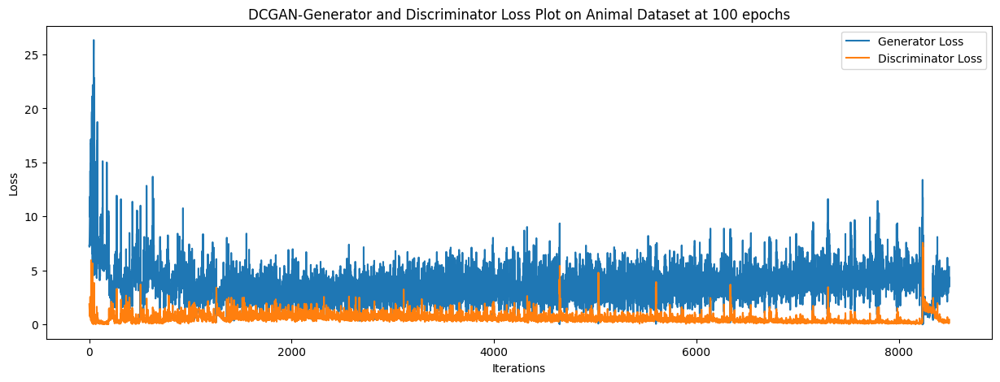

In [ ]:
plt.figure(figsize=(15,5))
plt.title("DCGAN-Generator and Discriminator Loss Plot on Animal Dataset at 100 epochs")
plt.plot(G_losses,label="Generator Loss")
plt.plot(D_losses,label="Discriminator Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()


Question 2:

Plot a 10 by 10 grid of images for generated images

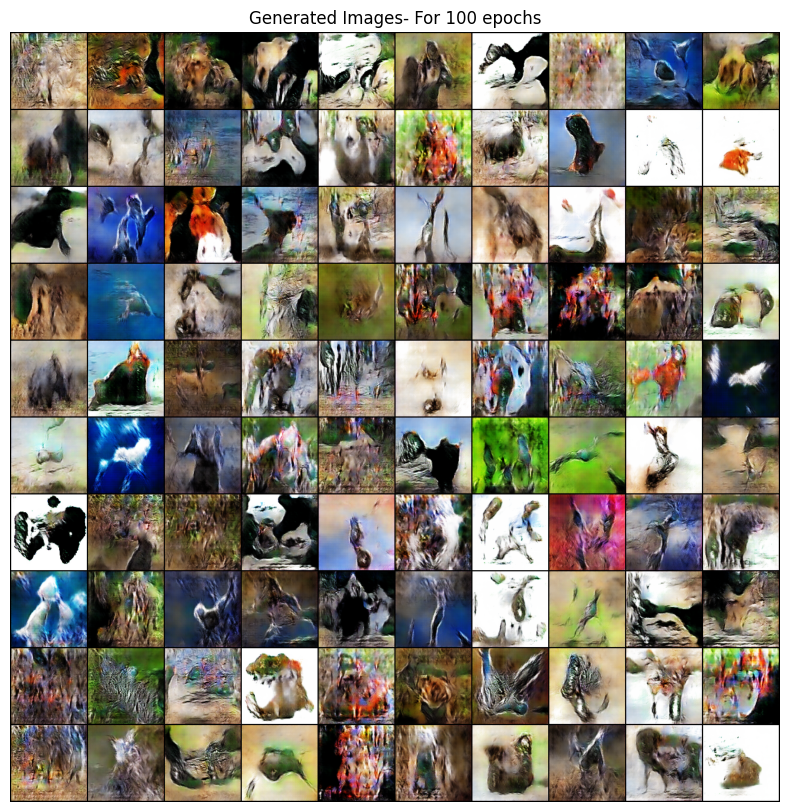

In [ ]:
# Plotting generated images in 10x10 grid
with torch.no_grad():
    fixed_noise = torch.randn(100, nz, 1, 1, device=device)
    fake_images = Gen(fixed_noise).detach().cpu()

plt.figure(figsize=(10,10))
plt.axis("off")
plt.title("Generated Images- For 100 epochs")
plt.imshow(np.transpose(vutils.make_grid(fake_images, nrow=10, padding=2, normalize=True), (1,2,0)))
plt.show()


Butterfly dataset(Trainig Loop)

100 epochs

In [ ]:
img_list = []
Gen_losses = []
Disc_losses = []

real_label = 1.
fake_label = 0.

iters = 0
num_epochs = 100

print("Starting...................")
for epoch in range(num_epochs):
    for i, data in enumerate(bydataloader, 0):
        Disc.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)#creating labels for real images
         #Forward pass(real images-discriminator)
        output = Disc(real_cpu).view(-1)
        Disc_real_loss = criterion(output, label)
        Disc_real_loss.backward()
        #Generating the fake images by generator
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = Gen(noise)
        label.fill_(fake_label)
        #Forward pass(Fake images-discriminator)
        output = Disc(fake.detach()).view(-1)
        Disc_fake_loss = criterion(output, label)
        Disc_fake_loss.backward()

        Disc_loss = Disc_real_loss + Disc_fake_loss
        #Disc_loss = (Disc_real_loss + Disc_fake_loss)/ 2
        Disc_optimizer.step()

        Gen.zero_grad()
        label.fill_(real_label)

        output = Disc(fake).view(-1)
        Gen_loss = criterion(output, label)
        Gen_loss.backward()
        Gen_optimizer.step()

        if i % 50 == 0: #print at every 50 iters
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'
                  % (epoch, num_epochs, i//50 + 1, len(bydataloader)//50 + 1,
                     Disc_loss.item(), Gen_loss.item()))

        Gen_losses.append(Gen_loss.item())
        Disc_losses.append(Disc_loss.item())

        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(bydataloader)-1)):
            with torch.no_grad():
                fake = Gen(fixed_noise).detach().cpu() #image generation at fixed noise
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting.................
[0/100][1/3]	Loss_D: 1.7540	Loss_G: 8.6687
[0/100][2/3]	Loss_D: 1.1697	Loss_G: 12.7519
[0/100][3/3]	Loss_D: 0.8809	Loss_G: 16.1215
[1/100][1/3]	Loss_D: 1.1979	Loss_G: 7.2577
[1/100][2/3]	Loss_D: 1.0323	Loss_G: 2.8760
[1/100][3/3]	Loss_D: 0.6117	Loss_G: 3.5748
[2/100][1/3]	Loss_D: 0.4386	Loss_G: 3.3774
[2/100][2/3]	Loss_D: 0.1245	Loss_G: 5.2995
[2/100][3/3]	Loss_D: 0.2458	Loss_G: 5.8620
[3/100][1/3]	Loss_D: 0.4826	Loss_G: 8.3843
[3/100][2/3]	Loss_D: 0.0827	Loss_G: 5.3671
[3/100][3/3]	Loss_D: 1.3027	Loss_G: 6.7448
[4/100][1/3]	Loss_D: 1.2689	Loss_G: 8.1684
[4/100][2/3]	Loss_D: 0.2711	Loss_G: 6.9587
[4/100][3/3]	Loss_D: 0.2285	Loss_G: 4.4179
[5/100][1/3]	Loss_D: 0.1680	Loss_G: 4.2563
[5/100][2/3]	Loss_D: 0.3107	Loss_G: 8.0203
[5/100][3/3]	Loss_D: 1.0989	Loss_G: 7.3163
[6/100][1/3]	Loss_D: 2.4300	Loss_G: 9.1514
[6/100][2/3]	Loss_D: 1.1482	Loss_G: 4.4608
[6/100][3/3]	Loss_D: 0.6952	Loss_G: 5.2923
[7/100][1/3]	Loss_D: 0.3409	Loss_G: 5.3699
[7/100][2/3]	Loss_D: 0.307

50 epochs

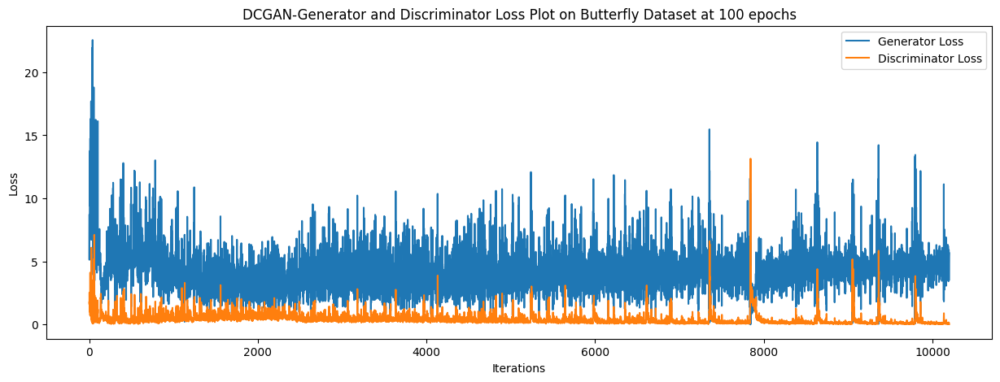

In [ ]:
plt.figure(figsize=(15,5))
plt.title("DCGAN-Generator and Discriminator Loss Plot on Butterfly Dataset at 100 epochs")
plt.plot(G_losses,label="Generator Loss")
plt.plot(D_losses,label="Discriminator Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()


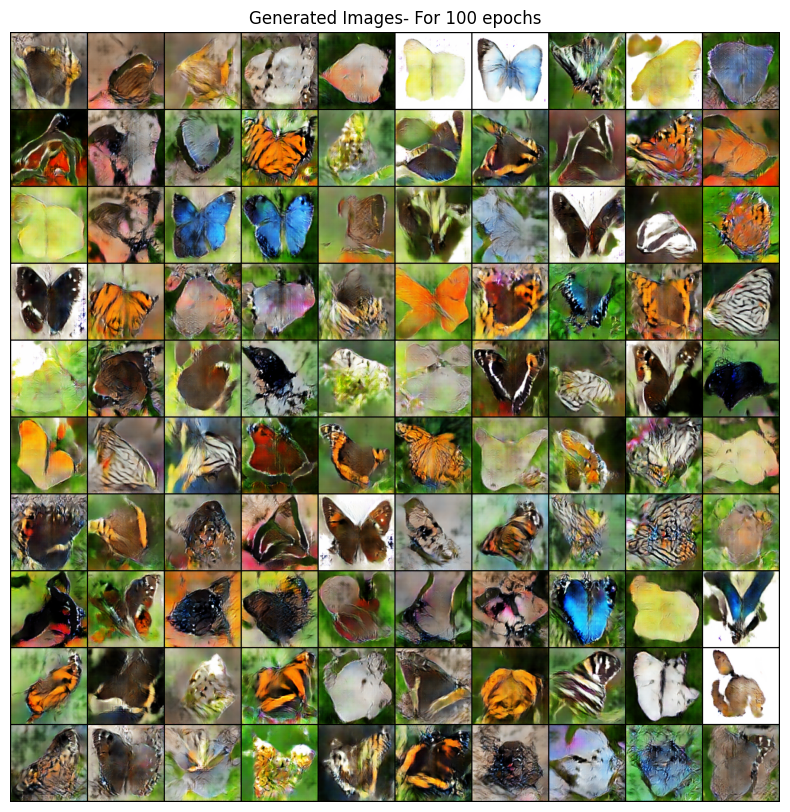

In [ ]:
# 10x10 grid for the final epoch
with torch.no_grad():
    fixed_noise = torch.randn(100, nz, 1, 1, device=device)
    fake_images = netG(fixed_noise).detach().cpu()

# Plot a 10x10 grid of generated images
plt.figure(figsize=(10,10))
plt.axis("off")
plt.title("Generated Images- For 100 epochs")
plt.imshow(np.transpose(vutils.make_grid(fake_images, nrow=10, padding=2, normalize=True), (1,2,0)))
plt.show()


In [ ]:
img_list = []
Gen_losses = []
Disc_losses = []

real_label = 1.
fake_label = 0.

iters = 0
num_epochs = 50

print("Starting...")
for epoch in range(num_epochs):
    for i, data in enumerate(bydataloader, 0):
        Disc.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)#creating labels for real images
         #Forward pass(real images-discriminator)
        output = Disc(real_cpu).view(-1)
        Disc_real_loss = criterion(output, label)
        Disc_real_loss.backward()
        #Generating the fake images by generator
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = Gen(noise)
        label.fill_(fake_label)
        #Forward pass(Fake images-discriminator)
        output = Disc(fake.detach()).view(-1)
        Disc_fake_loss = criterion(output, label)
        Disc_fake_loss.backward()

        Disc_loss = Disc_real_loss + Disc_fake_loss
        #Disc_loss = (Disc_real_loss + Disc_fake_loss)/ 2
        Disc_optimizer.step()

        Gen.zero_grad()
        label.fill_(real_label)

        output = Disc(fake).view(-1)
        Gen_loss = criterion(output, label)
        Gen_loss.backward()
        Gen_optimizer.step()

        if i % 50 == 0: #print at every 50 iters
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'
                  % (epoch, num_epochs, i//50 + 1, len(bydataloader)//50 + 1,
                     Disc_loss.item(), Gen_loss.item()))

        Gen_losses.append(Gen_loss.item())
        Disc_losses.append(Disc_loss.item())

        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(bydataloader)-1)):
            with torch.no_grad():
                fake = Gen(fixed_noise).detach().cpu() #image generation at fixed noise
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/50][1/3]	Loss_D: 1.8486	Loss_G: 8.4258
[0/50][2/3]	Loss_D: 1.3144	Loss_G: 12.1429
[0/50][3/3]	Loss_D: 1.0268	Loss_G: 4.0564
[1/50][1/3]	Loss_D: 0.6939	Loss_G: 2.4067
[1/50][2/3]	Loss_D: 0.3865	Loss_G: 2.7567
[1/50][3/3]	Loss_D: 0.5397	Loss_G: 4.4348
[2/50][1/3]	Loss_D: 0.5000	Loss_G: 5.3362
[2/50][2/3]	Loss_D: 0.1372	Loss_G: 4.0370
[2/50][3/3]	Loss_D: 0.3857	Loss_G: 4.1219
[3/50][1/3]	Loss_D: 0.2616	Loss_G: 3.8087
[3/50][2/3]	Loss_D: 1.6913	Loss_G: 9.8361
[3/50][3/3]	Loss_D: 0.1810	Loss_G: 5.2419
[4/50][1/3]	Loss_D: 0.2311	Loss_G: 5.2591
[4/50][2/3]	Loss_D: 0.8090	Loss_G: 2.1001
[4/50][3/3]	Loss_D: 0.6340	Loss_G: 3.5790
[5/50][1/3]	Loss_D: 0.9509	Loss_G: 7.8004
[5/50][2/3]	Loss_D: 2.3005	Loss_G: 6.2492
[5/50][3/3]	Loss_D: 0.3278	Loss_G: 3.8080
[6/50][1/3]	Loss_D: 0.2462	Loss_G: 3.4033
[6/50][2/3]	Loss_D: 1.2658	Loss_G: 0.7988
[6/50][3/3]	Loss_D: 0.9935	Loss_G: 5.7058
[7/50][1/3]	Loss_D: 0.8795	Loss_G: 3.7277
[7/50][2/3]	Loss_D: 2.2778	Loss_G: 8.1365
[7/50][

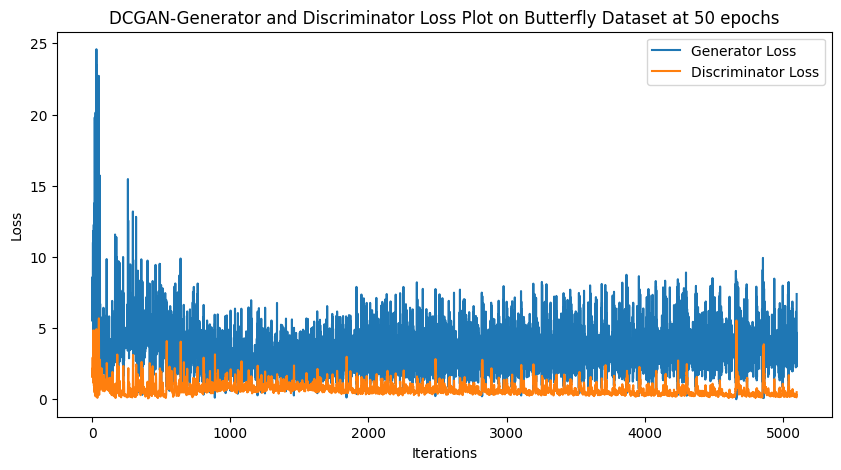

In [ ]:
plt.figure(figsize=(10,5))
plt.title("DCGAN-Generator and Discriminator Loss Plot on Butterfly Dataset at 50 epochs")
plt.plot(G_losses,label="Generator Loss")
plt.plot(D_losses,label="Discriminator Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()


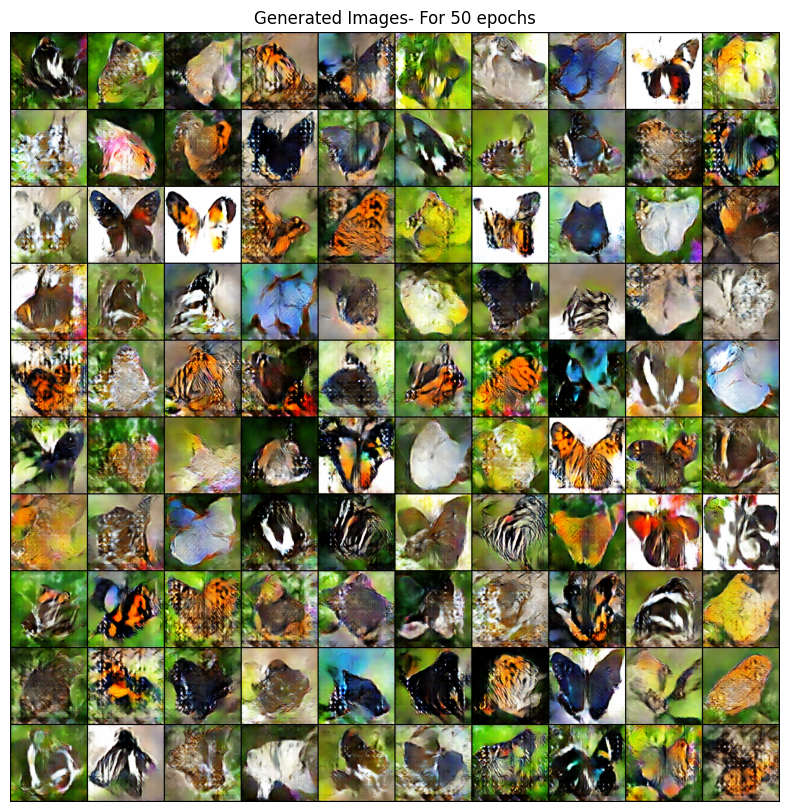

In [ ]:
# 10x10 grid
with torch.no_grad():
    fixed_noise = torch.randn(100, nz, 1, 1, device=device)
    fake_images = netG(fixed_noise).detach().cpu()

# Plot a 10x10 grid of generated images
plt.figure(figsize=(10,10))
plt.axis("off")
plt.title("Generated Images- For 50 epochs")
plt.imshow(np.transpose(vutils.make_grid(fake_images, nrow=10, padding=2, normalize=True), (1,2,0)))
plt.show()


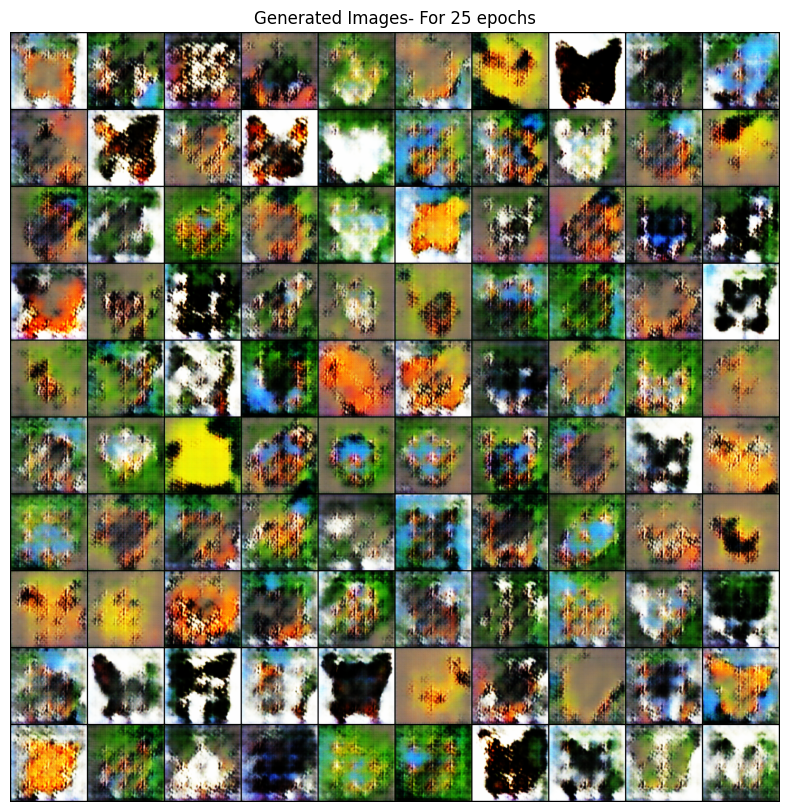

In [ ]:
# 10x10 grid
with torch.no_grad():
    fixed_noise = torch.randn(100, nz, 1, 1, device=device)
    fake_images = netG(fixed_noise).detach().cpu()

# Plot a 10x10 grid of generated images
plt.figure(figsize=(10,10))
plt.axis("off")
plt.title("Generated Images- For 25 epochs")
plt.imshow(np.transpose(vutils.make_grid(fake_images, nrow=10, padding=2, normalize=True), (1,2,0)))
plt.show()


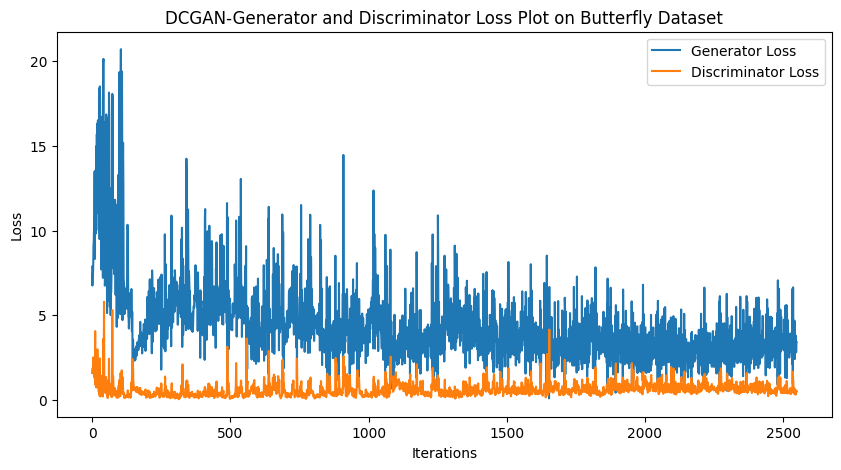

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.figure(figsize=(10,5))
plt.title("DCGAN-Generator and Discriminator Loss Plot on Butterfly Dataset at 25 epochs")
plt.plot(G_losses,label="Generator Loss")
plt.plot(D_losses,label="Discriminator Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()


In [ ]:
#Creating the paths and Saving the images corresponding created image paths

real_path = "./real_images"
fake_path = "./fake_images"

os.makedirs(real_path, exist_ok=True)
os.makedirs(fake_path, exist_ok=True)


def save_images_in_paths(images, path, prefix="img"):
    for i, imgs in enumerate(images):
        save_image(imgs, os.path.join(path, f"{i}.png"))

We have done some experimentations with beta's (we mentioned in report the values and insights we got)

Question 3:

Calculating FID (Fréchet Inception Distance) on 1000 samples


In [ ]:
pip install pytorch-fid

In [ ]:
# Collecting the 1000 real images
real_images = []
for i, (real_batch, _) in enumerate(dataloader):
    real_images.append(real_batch)
    #Ensures to pick the 1000 real images
    if len(torch.cat(real_images)) >= 1000:
        real_images = torch.cat(real_images)[:1000]
        break

save_images_in_paths(real_images, real_path)

In [ ]:
#Collecting the 1000 fake images from Generator model

fake_images = []
Gen.eval()

with torch.no_grad():
    while len(fake_images) < 1000:
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = Gen(noise)
        fake_images.append(fake)

    fake_images = torch.cat(fake_images)[:1000]

save_images(fake_images, fake_path)

In [ ]:

from pytorch_fid import fid_score

fid_value = fid_score.calculate_fid_given_paths([real_path, fake_path], batch_size=50, device=device, dims=2048)

print(f"FID score: {fid_value}")


Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 127MB/s]
100%|██████████| 20/20 [00:01<00:00, 15.81it/s]


FID score: 138.7065641657506


Note: FID for Butterfly dataset mentioned in report

Question 5:


Two types of latent space traversals and their corresponding plots

1 - Linear Interpolation


### Linear Interpolation Equation

The linear interpolation between two random latent vectors \( z_1 \) and \( z_2 \) is given by:

$$
z_{\text{interpolated}} = (1 - \alpha) \cdot z_1 + \alpha \cdot z_2
$$
where α is interpolating parameter

In [ ]:
# Linear interpolation function
def linear_traversal(z1, z2, num_steps=100):
    alphas = np.linspace(0, 1, num_steps)
    for alpha in alphas:
      interpolation_function =(1 - alpha) * z1 + alpha * z2 #Linear Interpolation equation

    return interpolated_function

# Two random latent vectors
z1 = torch.randn(1, nz, 1, 1, device=device)
z2 = torch.randn(1, nz, 1, 1, device=device)

interpolated_z = linear_traversal(z1, z2, num_steps=100)

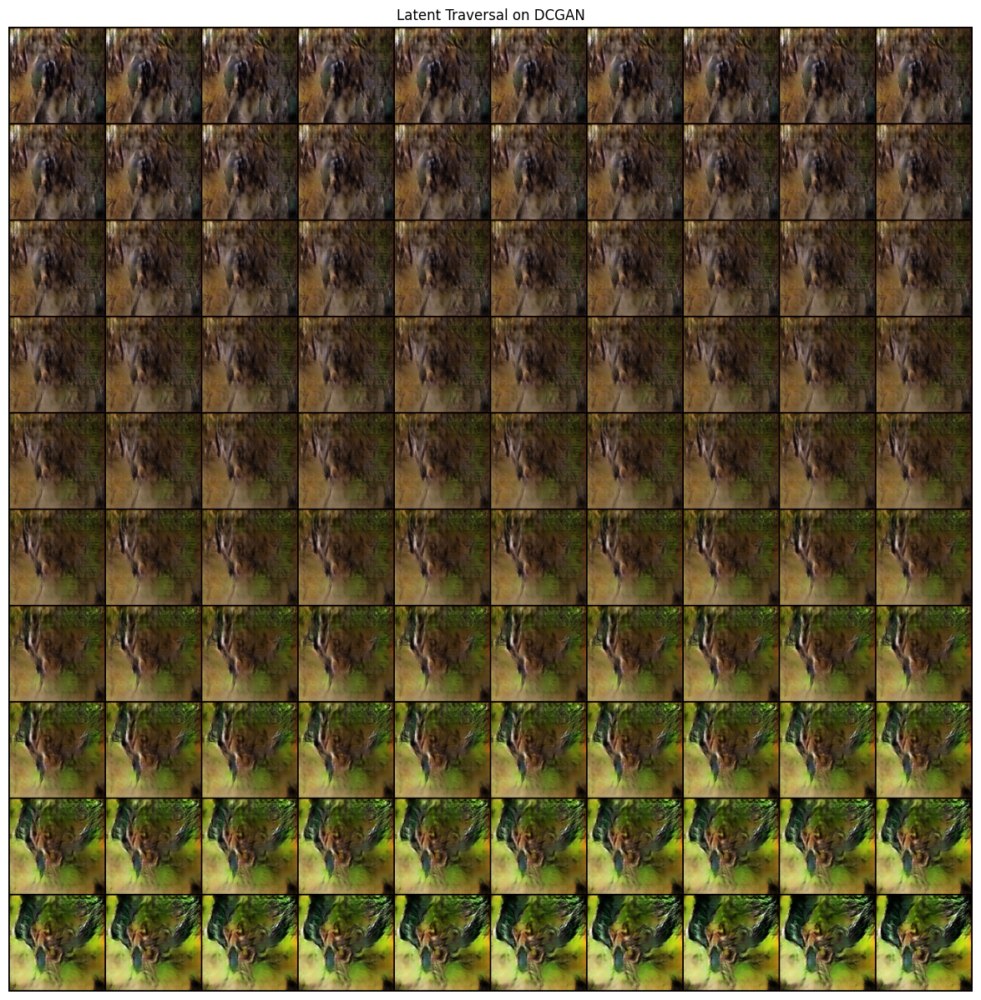

In [ ]:


# Generate images from the interpolated latent vectors
with torch.no_grad():
  for z in interpolated_z:
    linear_interpolated_images = torch.cat(Gen(z).detach().cpu(), dim=0)  # concatenating the tensors


plt.figure(figsize=(15, 15))
plt.axis("off")
plt.title("Latent Traversal on DCGAN")

plt.imshow(np.transpose(vutils.make_grid(linear_interpolated_images, padding=2, normalize=True, nrow=10), (1, 2, 0)))
plt.show()


On Butterfly dataset

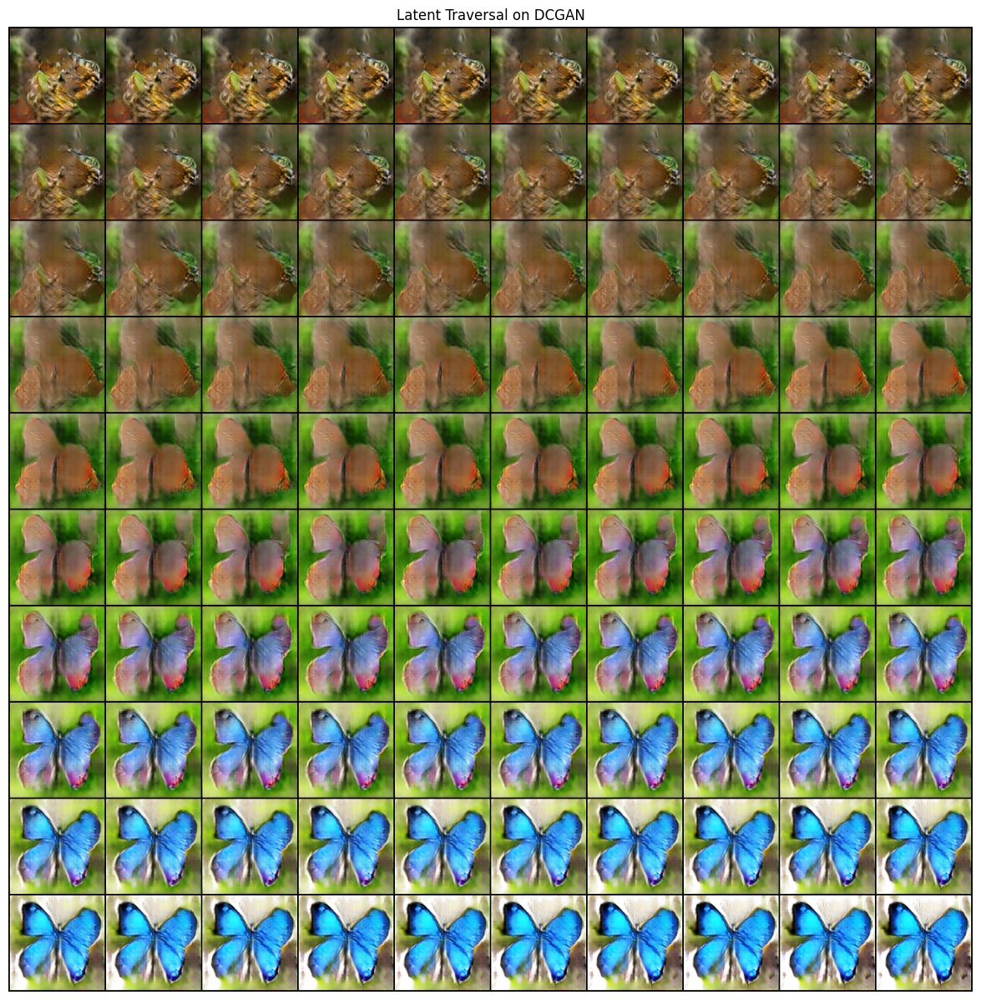

In [ ]:


# Generate images from the interpolated latent vectors
with torch.no_grad():
  for z in interpolated_z:
    linear_interpolated_images = torch.cat(Gen(z).detach().cpu(), dim=0)  # concatenating the tensors


plt.figure(figsize=(15, 15))
plt.axis("off")
plt.title("Latent Traversal on DCGAN")

plt.imshow(np.transpose(vutils.make_grid(linear_interpolated_images, padding=2, normalize=True, nrow=10), (1, 2, 0)))
plt.show()


In [ ]:
# device="cuda"
# cuda = True if torch.cuda.is_available() else False
# Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor
# LongTensor = torch.cuda.LongTensor if cuda else torch.LongTensor

# z1 = torch.randn(1, nz, 1, 1, device=device)
# z2 = torch.randn(1, nz, 1, 1, device=device)

# inter = torch.stack([z1 + (z2 - z1)*t for t in np.linspace(0, 1, 10)])

# print(inter.shape)

torch.Size([10, 1, 256, 1, 1])


2-Spherical Interpolation(non-linear)


### Spherical Interpolation Formula

Two random latent vectors \( z_1 \) and \( z_2 \) and a parameter t:

$$
\text{Spherical Interpolation}(z_1, z_2, t) = \frac{\sin((1 - t) \theta)}{\sin(\theta)} z_1 + \frac{\sin(t \theta)}{\sin(\theta)} z_2
$$

where:
- θ is the angle between \( z_1 \) and \( z_2 \) in latent space, calculated as:

$$
\theta = \arccos\left(\frac{z_1 \cdot z_2}{\|z_1\| \|z_2\|}\right)
$$


Images for Spherical interpolation mentioned in report

In [ ]:
z1 = torch.randn((1, nz, 1, 1)).to(device)
z2 = torch.randn((1, nz, 1, 1)).to(device)

Z = torch.zeros((0, nz, 1, 1))
Z_img = torch.zeros((0, 3, 128, 128))



In [ ]:

def spherical_interpolation(z1, z2, t):
    z1_norm = z1 / torch.norm(z1)
    z2_norm = z2 / torch.norm(z2)
    theta = torch.acos(torch.sum(z1_norm * z2_norm))
    interpolation_equation = (torch.sin((1 - t) * theta) / torch.sin(theta)) * z1 + (torch.sin(t * theta) / torch.sin(theta)) * z2 #spherical(non-linear) interpolation equation

    if torch.sin(theta) == 0:
        return z1

    return interpolation_equation

for i in range(100):
    t = i / 99
    z_new = spherical_interpolation(z1, z2, t)
    z_new_img = Gen(z_new).cpu() # Generates the image from the interpolated latent vector


    Z = torch.cat((Z, z_new.cpu()))
    Z_img = torch.cat((Z_img, z_new_img))

print(Z_img.shape)
save_image(Z_img * 0.5 + 0.5, '/content/drive/MyDrive/chaitanya/Animal_spherical.png', nrow=10)


torch.Size([100, 3, 128, 128])
